<a href="https://colab.research.google.com/github/piyushdutt28/Segment-Anything-Model-with-YOLOv5/blob/main/OD_Seg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Object Detection using Yolov5 and segmentation using SAM

First, we clone the repositories of YOLOv5 and Segment Anything using the following commands:



In [21]:
!git clone https://github.com/ultralytics/yolov5  # clone
!git clone https://github.com/facebookresearch/segment-anything.git  # clone


fatal: destination path 'yolov5' already exists and is not an empty directory.
fatal: destination path 'segment-anything' already exists and is not an empty directory.


Import modules from SAM repo for loading weights and the model itself.

In [22]:
%cd /content/segment-anything
from segment_anything import sam_model_registry, SamPredictor
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cpu" #change to cpu if cuda not available
 
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)
predictor = SamPredictor(sam)


/content/segment-anything
--2023-05-13 06:15:23--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.249.85.89, 13.249.85.19, 13.249.85.39, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.249.85.89|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth.3’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   175MB/s    in 18s     

2023-05-13 06:15:41 (138 MB/s) - ‘sam_vit_h_4b8939.pth.3’ saved [2564550879/2564550879]



Import modules from yolov5 repo to load the model weights. 
Then we check the class number for "horse" class to use later in NMS.

In [23]:
%cd /content/yolov5
from models.common import DetectMultiBackend
weights = "yolov5s.pt"
model = DetectMultiBackend(weights)
names = model.names
clas = [key for key, value in names.items() if value == 'horse'][0]
print("Horse class number:", clas)

/content/yolov5


Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients


Horse class number: 17


Three Function definitions:
1. yolo_inference: Takes input as numpy image, and returns predicted bounding box information for horse class

2. sam_inference: Takes path of image, sets it on predictor class. Outputs the boolean mask by using the in-built SAM tool taking information of the detected bounding box.

3. The mask obtained from sam Segmentation is put on the input image and then its saved in the drive. (also displays the output images)

In [24]:
from utils.general import non_max_suppression
from google.colab.patches import cv2_imshow
import cv2
import torch
import os
def yolo_inference(im):
    im = torch.from_numpy(im).to(model.device)
    im = im.half() if model.fp16 else im.float()  # uint8 to fp16/32
    im /= 255  # 0 - 255 to 0.0 - 1.0
    if len(im.shape) == 3:
        im = im[None]  # expand for batch dim

    pred = model(im)


    pred = non_max_suppression(pred, conf_thres=0.25, iou_thres=0.45, classes=clas, agnostic=True)
    print(pred)
    return pred


def sam_inference(path, box):
    image = cv2.imread(path)

    predictor.set_image(image)
    input_box = np.array(box)
    masks, _, _ = predictor.predict(
        point_coords=None,
        point_labels=None,
        box=input_box[None, :],
        multimask_output=False,
    )
    return masks

def masking_image(path, masks):
    if not os.path.exists("/content/Output"):
        os.mkdir("/content/Output")
    image = cv2.imread(path)

    translucent_mask = np.zeros_like(image, dtype=np.uint8)
    translucent_mask[..., 2] = masks[0] * 255 

    overlay = cv2.addWeighted(image, 1, translucent_mask, 15, 0)

    cv2.rectangle(overlay, list(box[:2]), list(box[2:]), color=(0,255,0), thickness=2)
    cv2_imshow(overlay)
    cv2.imwrite("/content/Output/Output" + path[path.find('.')-1] + ".png", overlay)





All the images are loaded using dataloader in yolov5 repo.
1. Iteratively the images are passed to yolo_inference model, then the bounding box info and image to SAM. The mask is given to the function and the result is stored and saved in the drive.
2. Uses ScaleBoxes function for scaling the box, as the inference is done on resized image.

[tensor([[272.89951, 126.99480, 478.25058, 275.07983,   0.92516,  17.00000]])]
[tensor(272.89951), tensor(126.99480), tensor(478.25058), tensor(275.07983)]
[      272.9      126.99      478.25      275.08]
(3, 384, 640)
boxes [1435, 789] <class 'list'>


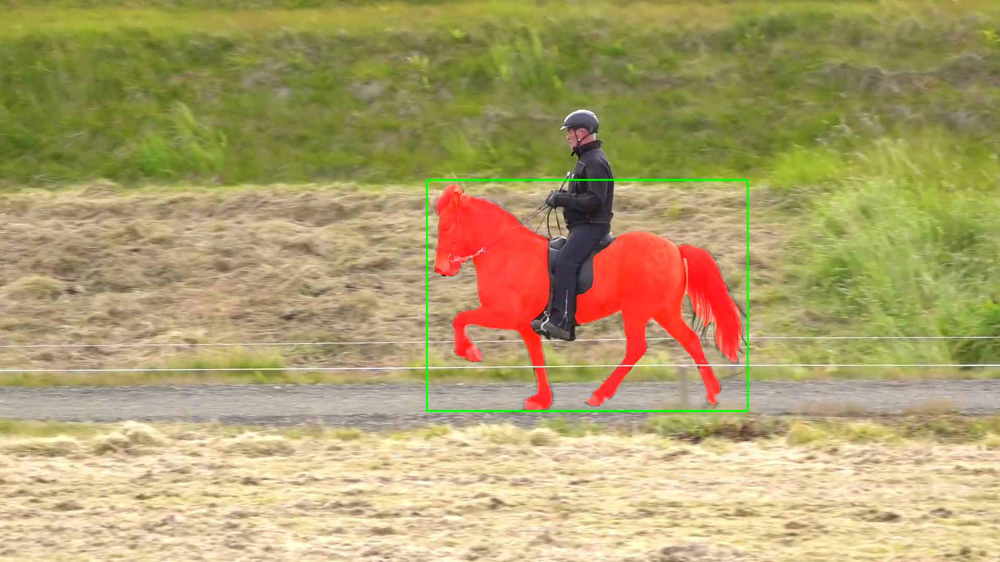

[tensor([[124.08522, 131.80759, 424.18555, 310.41766,   0.93780,  17.00000]])]
[tensor(124.08522), tensor(131.80759), tensor(424.18555), tensor(310.41766)]
[     124.09      131.81      424.19      310.42]
(3, 384, 640)
boxes [1273, 895] <class 'list'>


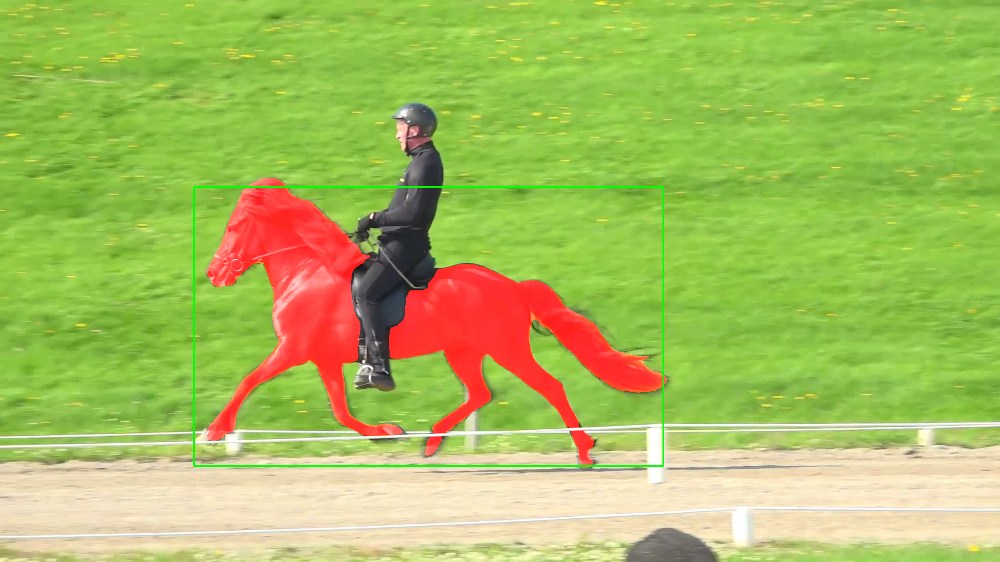

[tensor([[245.94501, 122.98327, 519.76215, 303.88007,   0.90799,  17.00000]])]
[tensor(245.94501), tensor(122.98327), tensor(519.76215), tensor(303.88007)]
[     245.95      122.98      519.76      303.88]
(3, 384, 640)
boxes [1559, 876] <class 'list'>


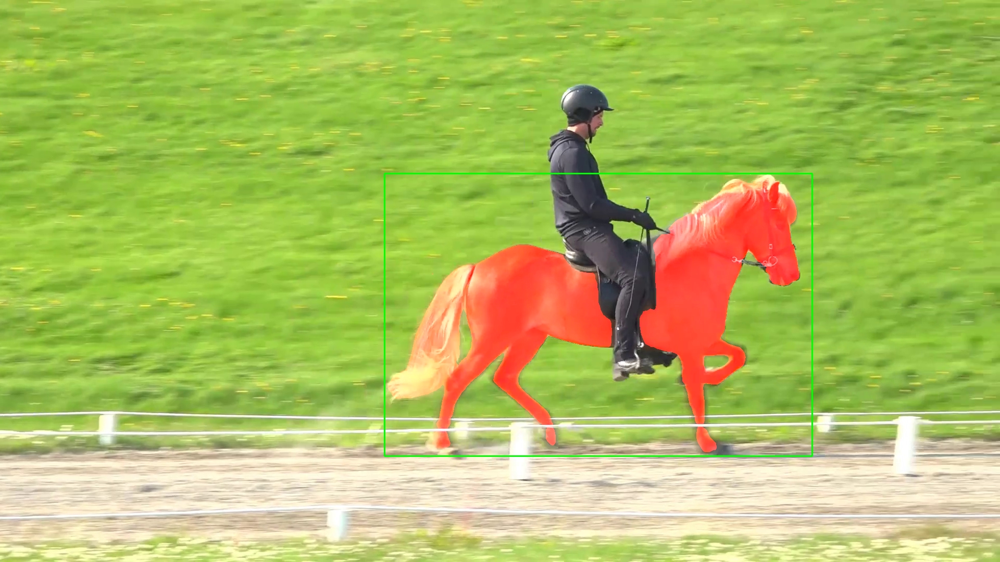

[tensor([[257.95108, 126.26306, 574.48853, 303.57275,   0.93099,  17.00000]])]
[tensor(257.95108), tensor(126.26306), tensor(574.48853), tensor(303.57275)]
[     257.95      126.26      574.49      303.57]
(3, 384, 640)
boxes [1723, 875] <class 'list'>


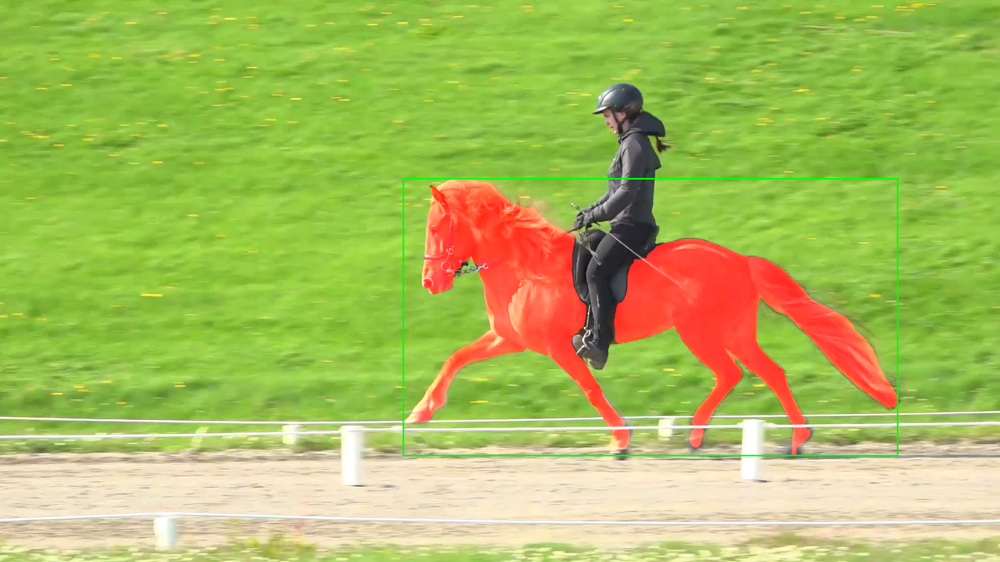

[tensor([[178.31856, 136.16432, 435.50781, 302.16132,   0.94686,  17.00000]])]
[tensor(178.31856), tensor(136.16432), tensor(435.50781), tensor(302.16132)]
[     178.32      136.16      435.51      302.16]
(3, 384, 640)
boxes [1307, 870] <class 'list'>


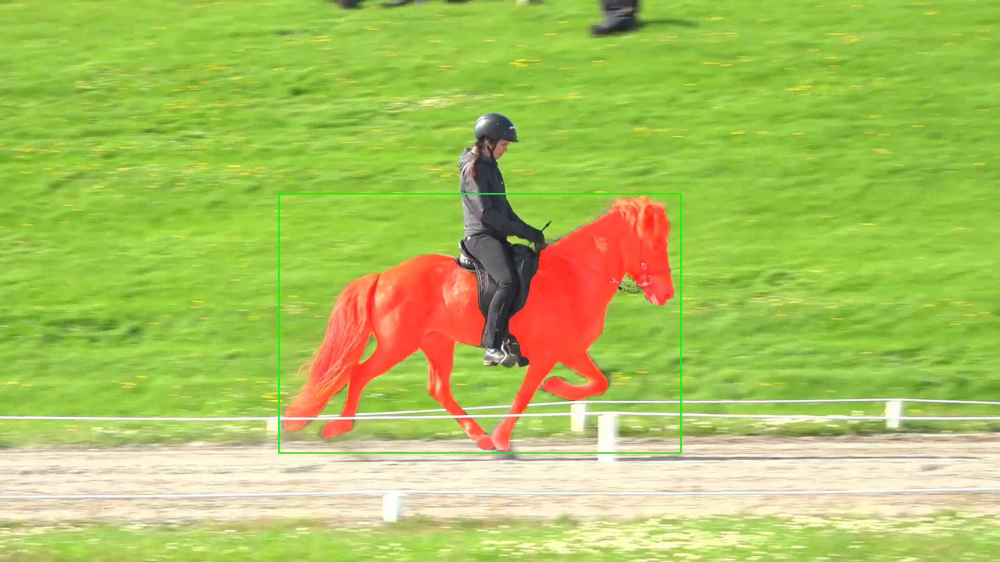

[tensor([[155.05508, 123.36874, 402.44821, 321.98077,   0.93271,  17.00000]])]
[tensor(155.05508), tensor(123.36874), tensor(402.44821), tensor(321.98077)]
[     155.06      123.37      402.45      321.98]
(3, 384, 640)
boxes [1207, 930] <class 'list'>


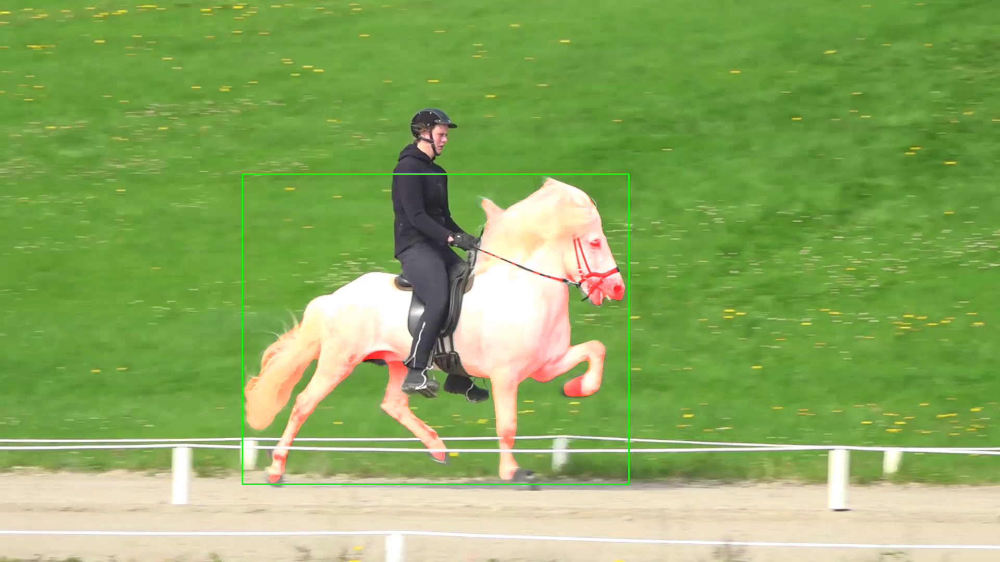

In [25]:
from utils.dataloaders import LoadImages
from utils.general import scale_boxes
import numpy as np


source = "/content/data"
images = LoadImages(source)

for path, im, im0s, vid_cap, s in images:
  
        pred = yolo_inference(im)
        
        if len(pred[0]):
            for *xyxy, conf, cls in reversed(pred[0]):
                print(xyxy)
                image = cv2.imread(path)
                pred = np.asarray([tensor.item() for tensor in xyxy])
                print(pred)
                print(im.shape)
                box = scale_boxes(im.shape[1:], pred[:4], image.shape).round()
                box= [int(i) for i in box]
                print('boxes', box[2:], type(box))
                masks = sam_inference(path, box)

                masking_image(path, masks)

              